# Checking the GPU status

In [9]:
#@title
! nvidia-smi

Fri Nov  4 03:05:15 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 520.61.05    Driver Version: 520.61.05    CUDA Version: 11.8     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Quadro GV100        On   | 00000000:73:00.0 Off |                  Off |
| 29%   39C    P2    24W / 250W |   2572MiB / 32768MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Install the required packages

In [10]:
%pip install captum timm shap grad-cam

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


# Import the required packages

In [11]:
import timm
import urllib
import torch

import numpy as np

import torchvision.transforms as T
import torch.nn.functional as F

from PIL import Image

from matplotlib.colors import LinearSegmentedColormap

import matplotlib.pyplot as plt

# Set the device to GPU

In [12]:
device = torch.device("cuda")

# Import the resnet18 model from timm and send it to evaluation mode

In [13]:
model = timm.create_model("resnet18", pretrained=True)
model.eval()
model = model.to(device)

# Download the Imagenet class lables

In [14]:
# Download human-readable labels for ImageNet.
# get the classnames
url, filename = (
    "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt",
    "imagenet_classes.txt",
)
urllib.request.urlretrieve(url, filename)
with open("imagenet_classes.txt", "r") as f:
    categories = [s.strip() for s in f.readlines()]


# Create the transforms

In [15]:
transform = T.Compose([
    T.Resize(256),
    T.CenterCrop(224),
    T.ToTensor()
])

transform_normalize = T.Normalize(
     mean=[0.485, 0.456, 0.406],
     std=[0.229, 0.224, 0.225]
)

# Import the 10 Images

In [16]:
# Imports PIL module 
from PIL import Image
  
# open method used to open different extension image file
images=[]
images.append(Image.open('Images/Mobile.jpeg'))
images.append(Image.open('Images/WaterBottle.jpeg'))
images.append(Image.open('Images/Dustbin.jpeg'))
images.append(Image.open('Images/CofferCup.jpeg'))
images.append(Image.open('Images/Switch.jpeg'))
images.append(Image.open('Images/MosquitoNet.jpeg'))
images.append(Image.open('Images/Mouse.jpeg'))
images.append(Image.open('Images/PuppyDoll.jpeg'))
images.append(Image.open('Images/WallClock.jpeg'))
images.append(Image.open('Images/Keyboard.jpeg'))

# Finding the indexes of 10 images by sending them the model

In [17]:
indexes=[]
for image in images:
    transformed_img = transform(image)
    img_tensor = transform_normalize(transformed_img)
    img_tensor = img_tensor.unsqueeze(0)
    img_tensor = img_tensor.to(device)
    output = model(img_tensor)
    output = F.softmax(output, dim=1)
    prediction_score, pred_label_idx = torch.topk(output, 1)  
    indexes.append(pred_label_idx.item())

# Captum Model Interpretation

In [18]:
from captum.attr import IntegratedGradients
from captum.attr import GradientShap
from captum.attr import Occlusion
from captum.attr import NoiseTunnel
from captum.attr import visualization as viz
from captum.attr import Saliency
from captum.attr import DeepLift

# Integrated Gradients(IG)

Predicted: cellular telephone ( 0.803377091884613 )


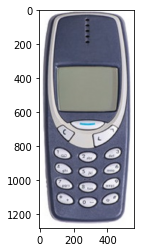

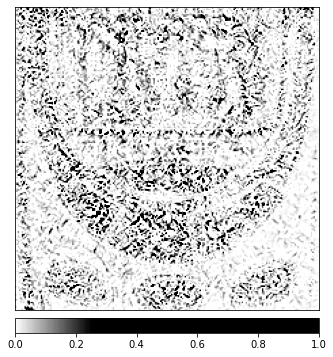

Predicted: water jug ( 0.22381456196308136 )


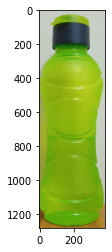

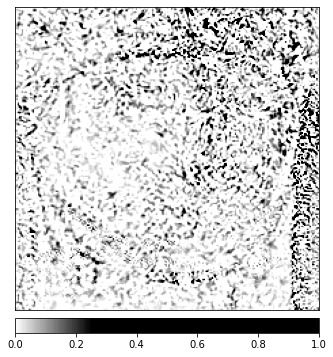

Predicted: bucket ( 0.7018595337867737 )


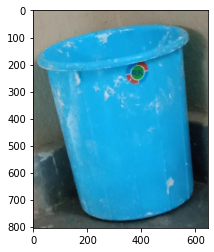

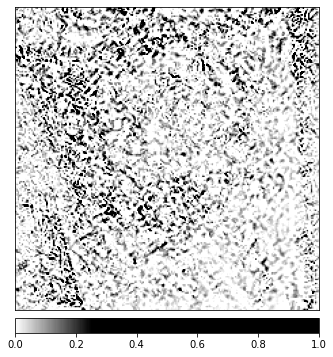

Predicted: coffee mug ( 0.7594356536865234 )


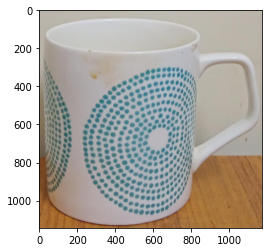

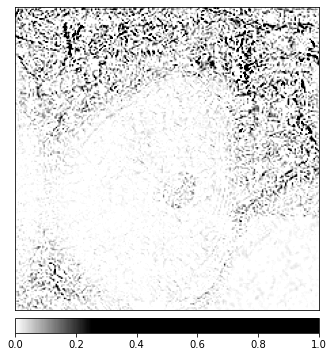

Predicted: switch ( 0.3124171495437622 )


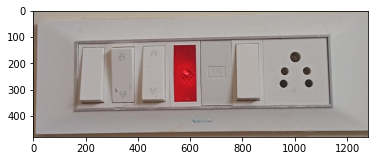

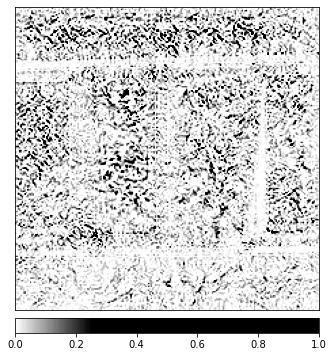

Predicted: racket ( 0.9916040301322937 )


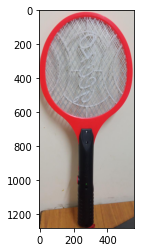

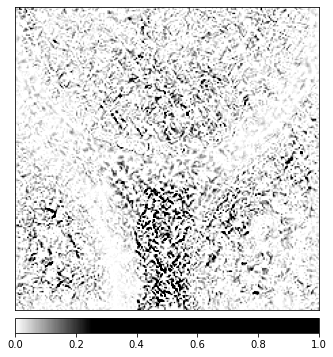

Predicted: mouse ( 0.6131901741027832 )


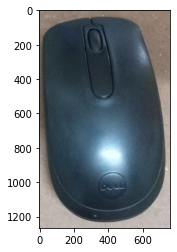

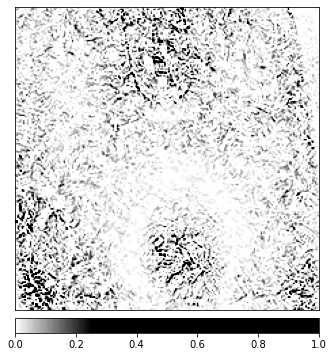

Predicted: teddy ( 0.6494601368904114 )


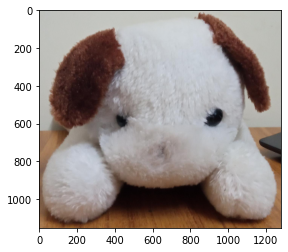

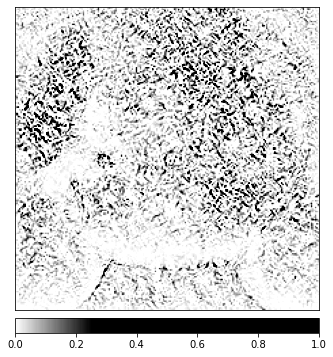

Predicted: wall clock ( 0.6318039894104004 )


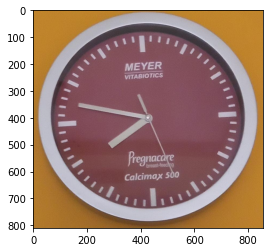

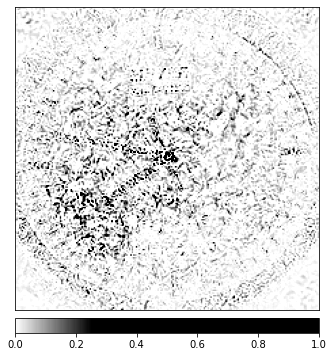

Predicted: computer keyboard ( 0.6224139332771301 )


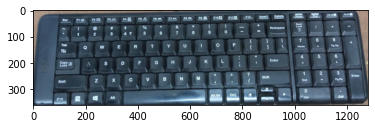

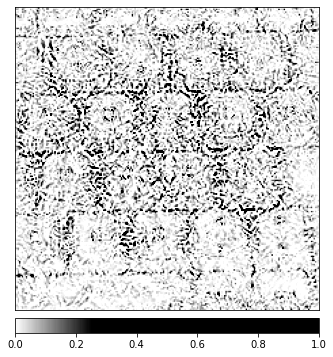

In [19]:
for image in images:
    transformed_img = transform(image)
    img_tensor = transform_normalize(transformed_img)
    img_tensor = img_tensor.unsqueeze(0)
    img_tensor = img_tensor.to(device)
    output = model(img_tensor)
    output = F.softmax(output, dim=1)
    prediction_score, pred_label_idx = torch.topk(output, 1)
    pred_label_idx.squeeze_()
    predicted_label = categories[pred_label_idx.item()]
    print('Predicted:', predicted_label, '(', prediction_score.squeeze().item(), ')')

    integrated_gradients = IntegratedGradients(model)
    attributions_ig = integrated_gradients.attribute(img_tensor, target=pred_label_idx, n_steps=200)
    
    default_cmap = LinearSegmentedColormap.from_list('custom blue', 
                                                 [(0, '#ffffff'),
                                                  (0.25, '#000000'),
                                                  (1, '#000000')], N=256)
    plt.imshow(image)

    _ = viz.visualize_image_attr(np.transpose(attributions_ig.squeeze().cpu().detach().numpy(), (1,2,0)),
                                 np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                                 method='heat_map',
                                 cmap=default_cmap,
                                 show_colorbar=True,
                                 sign='positive',
                                 outlier_perc=1)

# Integrated gradients with Noise Tunnel

Predicted: cellular telephone ( 0.803377091884613 )


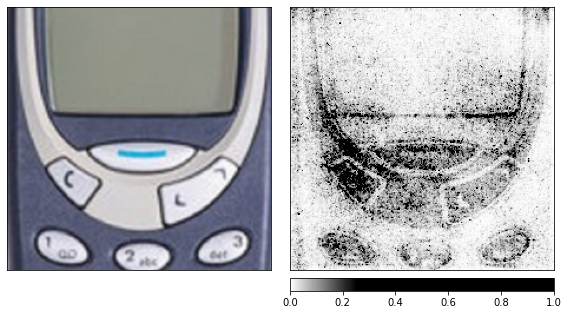

Predicted: water jug ( 0.22381456196308136 )


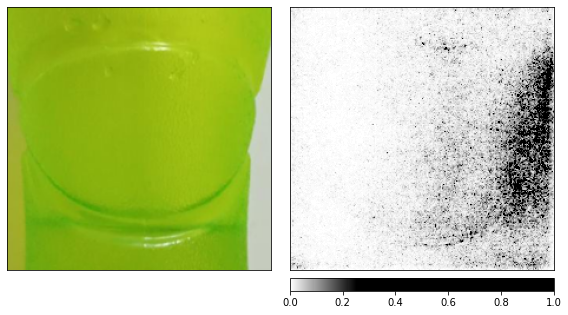

Predicted: bucket ( 0.7018595337867737 )


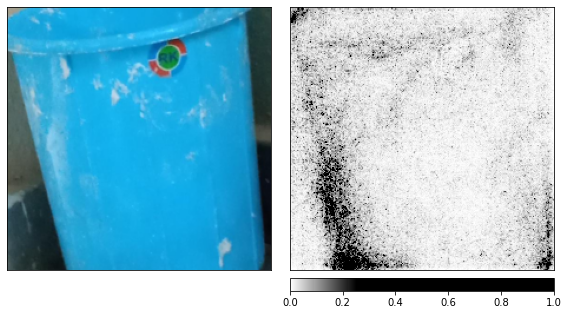

Predicted: coffee mug ( 0.7594356536865234 )


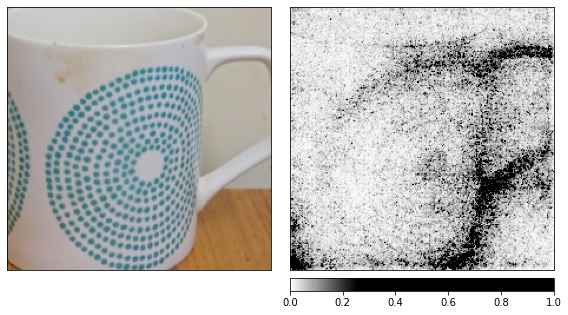

Predicted: switch ( 0.3124171495437622 )


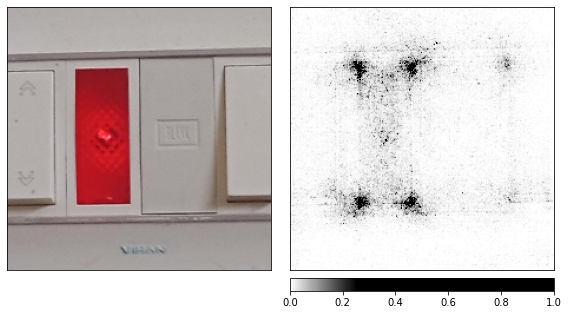

Predicted: racket ( 0.9916040301322937 )


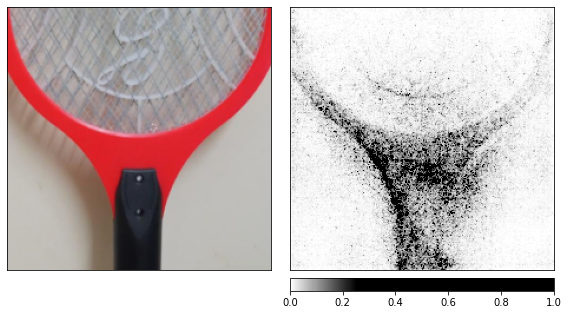

Predicted: mouse ( 0.6131901741027832 )


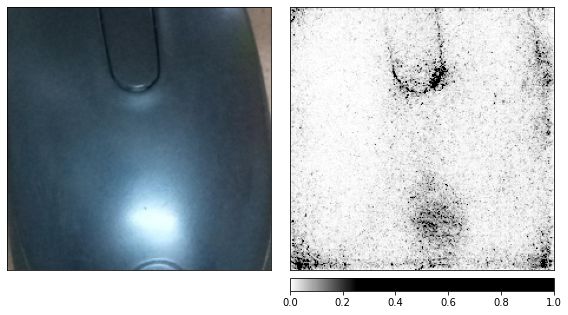

Predicted: teddy ( 0.6494601368904114 )


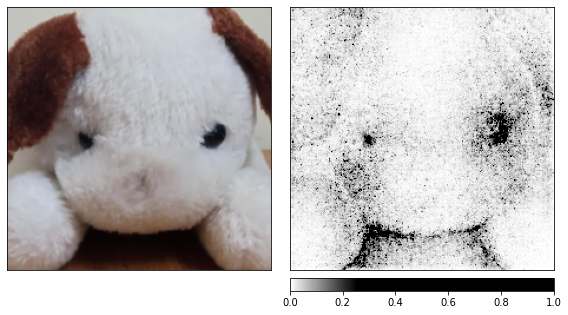

Predicted: wall clock ( 0.6318039894104004 )


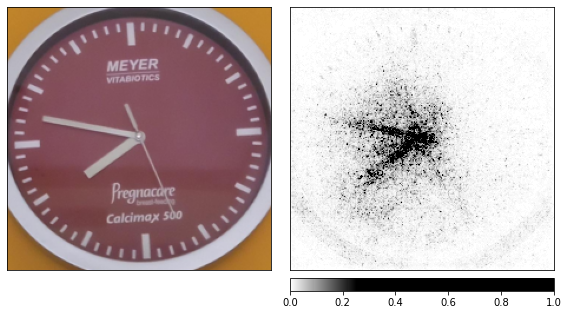

Predicted: computer keyboard ( 0.6224139332771301 )


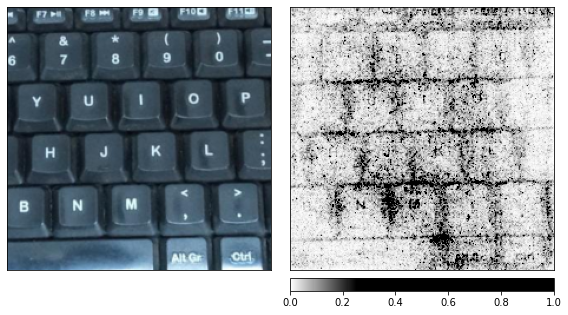

In [20]:
for image in images:
    transformed_img = transform(image)

    img_tensor = transform_normalize(transformed_img)
    img_tensor = img_tensor.unsqueeze(0)

    img_tensor = img_tensor.to(device)
    output = model(img_tensor)
    output = F.softmax(output, dim=1)
    prediction_score, pred_label_idx = torch.topk(output, 1)

    pred_label_idx.squeeze_()
    predicted_label = categories[pred_label_idx.item()]
    print('Predicted:', predicted_label, '(', prediction_score.squeeze().item(), ')')

    integrated_gradients = IntegratedGradients(model)    
    noise_tunnel = NoiseTunnel(integrated_gradients)

    attributions_ig_nt = noise_tunnel.attribute(img_tensor, nt_samples=10, nt_type='smoothgrad_sq', target=pred_label_idx)
    _ = viz.visualize_image_attr_multiple(np.transpose(attributions_ig_nt.squeeze().cpu().detach().numpy(), (1,2,0)),
                                          np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                                          ["original_image", "heat_map"],
                                          ["all", "positive"],
                                          cmap=default_cmap,
                                          show_colorbar=True)

# Saliency

In [21]:
def attribute_image_features(algorithm, target1,input, **kwargs):
    model.zero_grad()
    tensor_attributions = algorithm.attribute(input,
                                              target=target1,
                                              **kwargs
                                             )
    
    return tensor_attributions

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


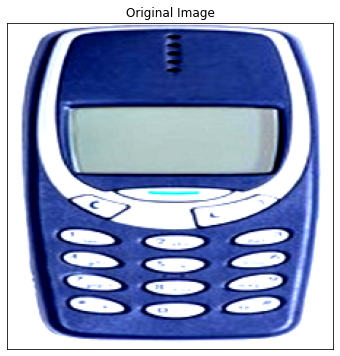

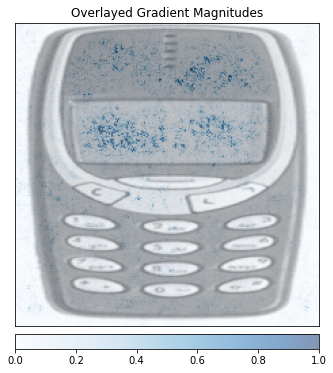

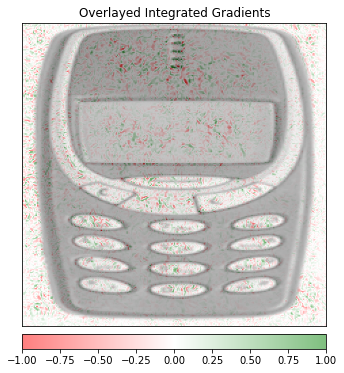

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


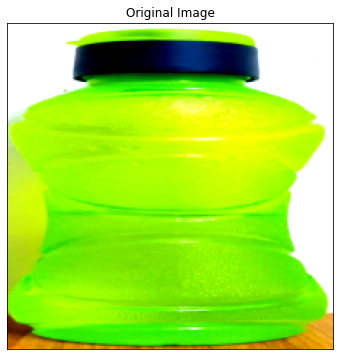

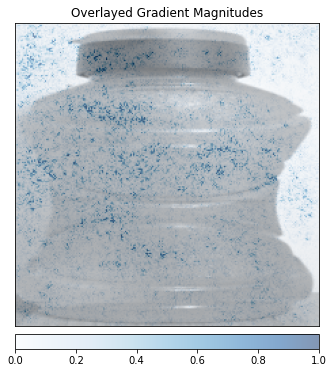

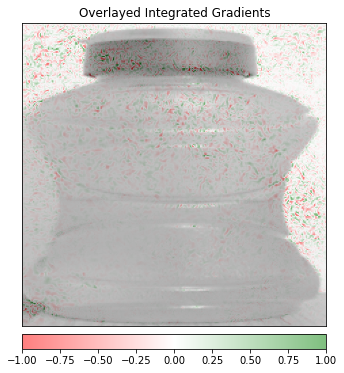

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


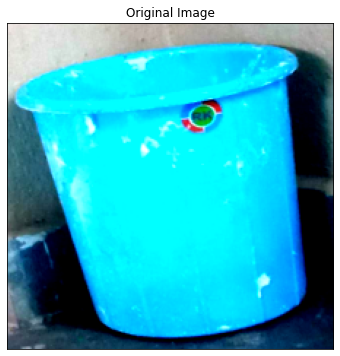

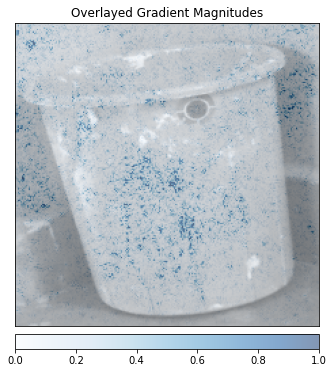

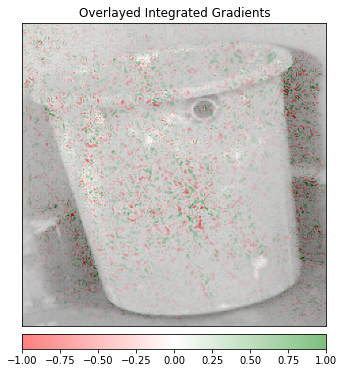

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


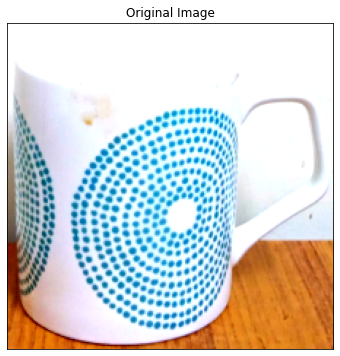

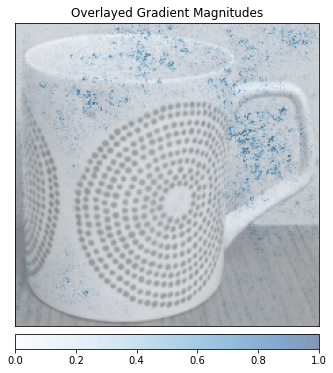

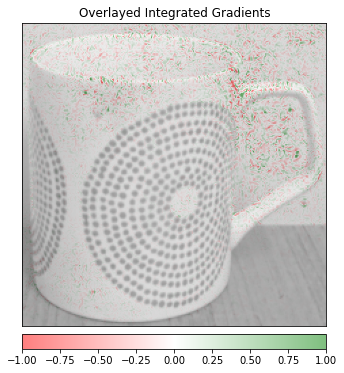

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


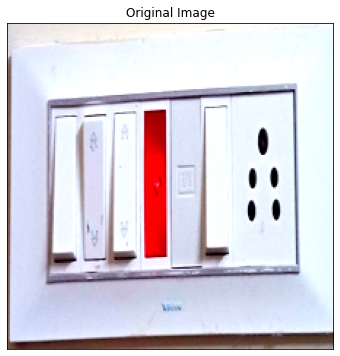

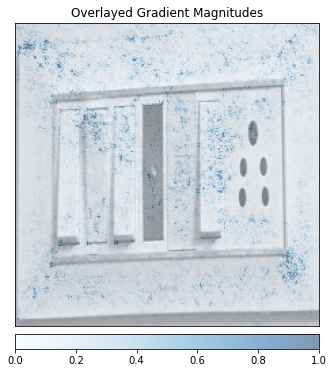

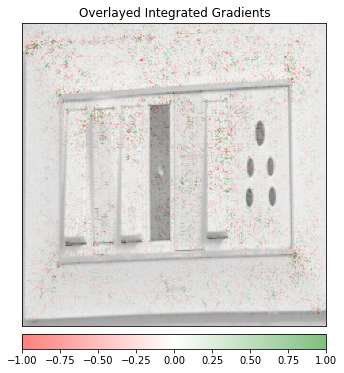

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


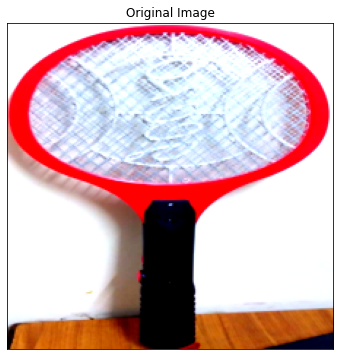

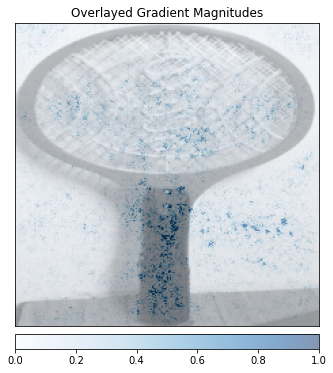

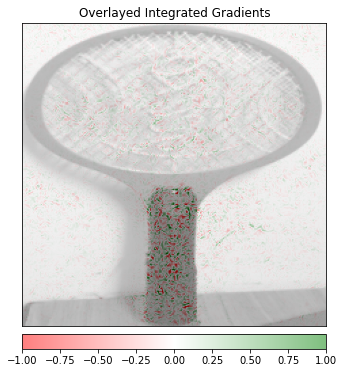

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


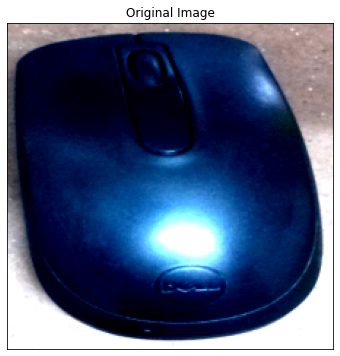

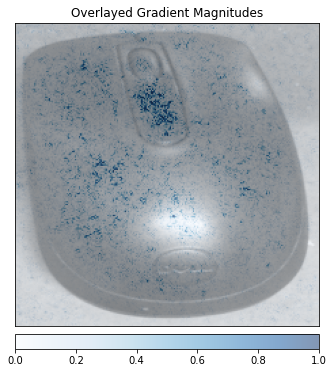

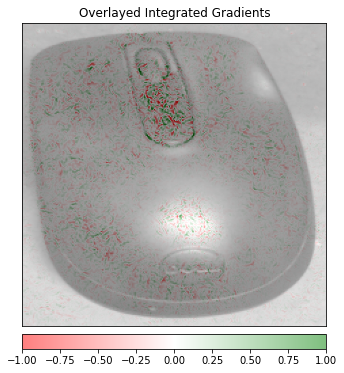

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


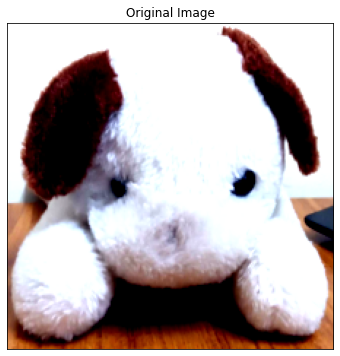

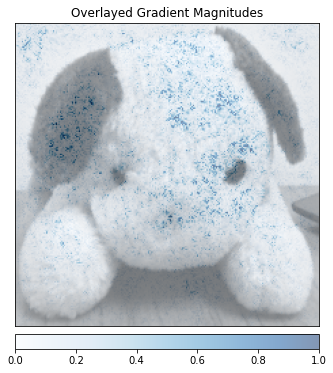

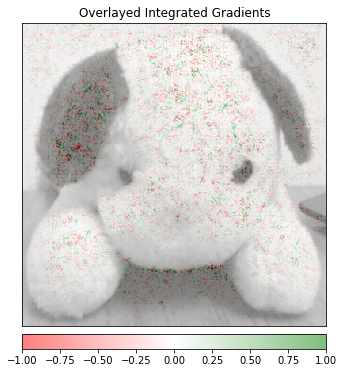

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


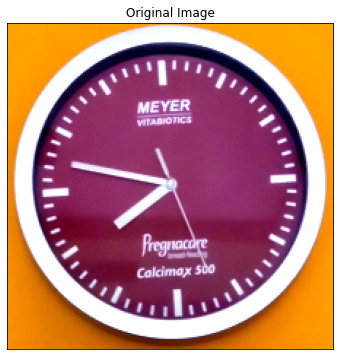

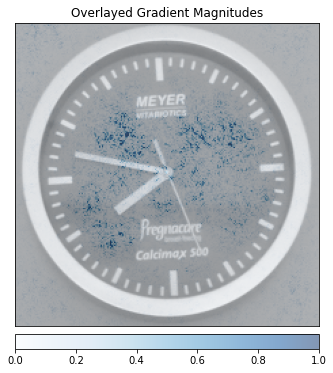

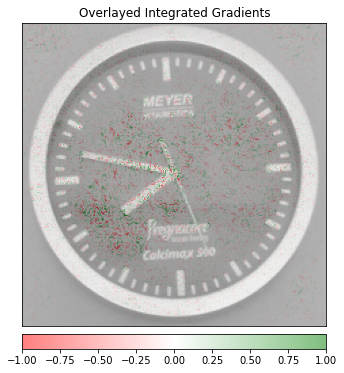

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


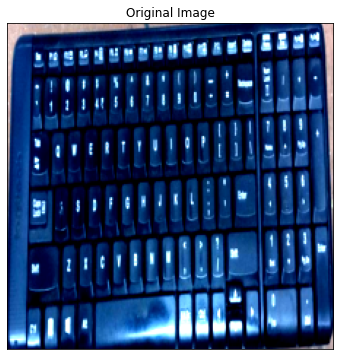

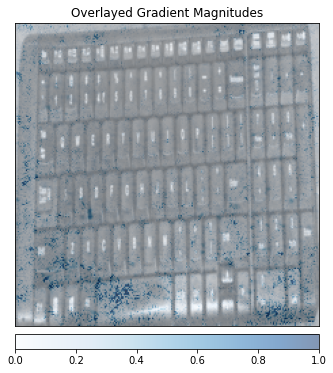

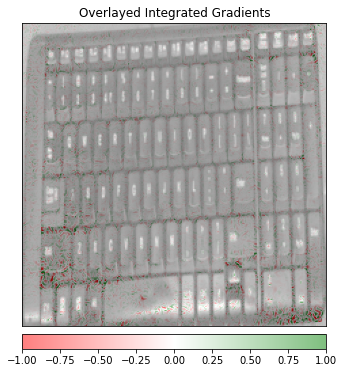

In [22]:
for i in range(len(images)):
    transform = T.Compose([
        T.Resize((224, 224)),
        T.ToTensor(),
        T.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )
    ])

    #img = Image.open('cat.jpeg')

    img_tensor = transform(images[i])
    img_tensor = img_tensor.unsqueeze(0)
    img_tensor.requires_grad = True
    img_tensor = img_tensor.to(device)
    saliency = Saliency(model)
    grads = saliency.attribute(img_tensor, target=indexes[i])
    grads = np.transpose(grads.squeeze().cpu().detach().numpy(), (1, 2, 0))
    original_image = np.transpose((img_tensor.squeeze(0).cpu().detach().numpy() / 2) + 0.5, (1, 2, 0))
    _ = viz.visualize_image_attr(None, original_image, 
                      method="original_image", title="Original Image")
    _ = viz.visualize_image_attr(grads, original_image, method="blended_heat_map", sign="absolute_value",
                          show_colorbar=True, title="Overlayed Gradient Magnitudes")
    ig = IntegratedGradients(model)
    attr_ig, delta = attribute_image_features(ig, indexes[i],img_tensor, baselines=img_tensor * 0, return_convergence_delta=True)
    attr_ig = np.transpose(attr_ig.squeeze().cpu().detach().numpy(), (1, 2, 0))
    #print('Approximation delta: ', abs(delta))
    _ = viz.visualize_image_attr(attr_ig, original_image, method="blended_heat_map", sign="all",
                          show_colorbar=True, title="Overlayed Integrated Gradients")

# Occlusion

Predicted: honeycomb ( 0.2919740676879883 )


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


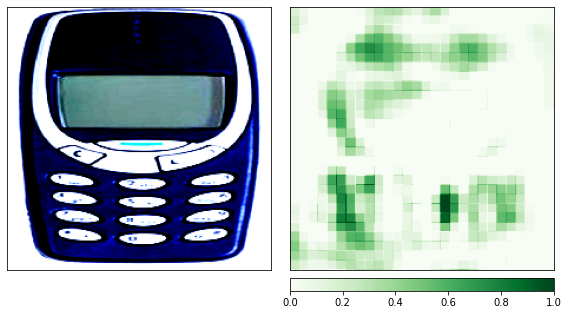

Predicted: digital clock ( 0.5616500377655029 )


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


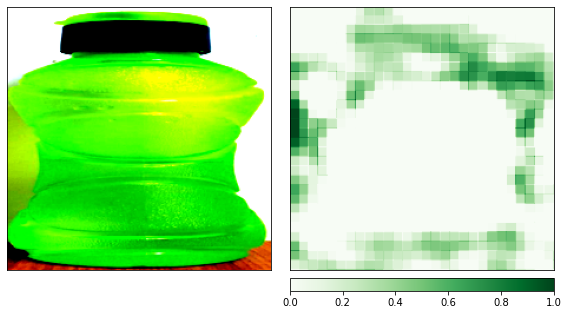

Predicted: mortar ( 0.4330064654350281 )


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


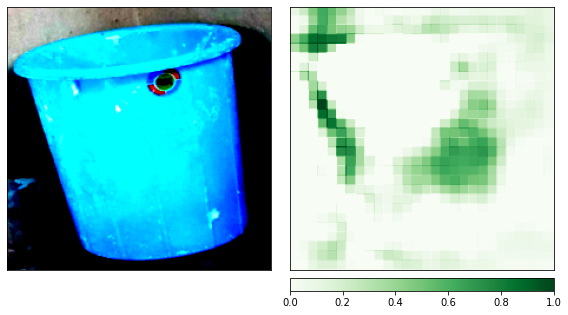

Predicted: coffee mug ( 0.5445936322212219 )


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


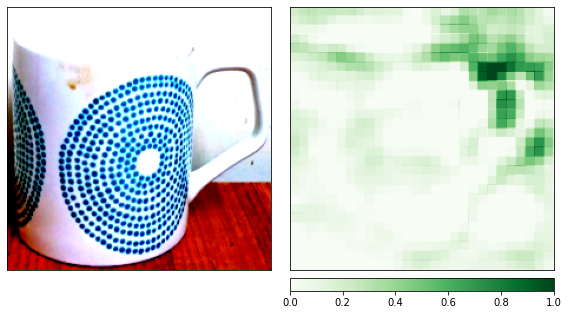

Predicted: digital clock ( 0.26455655694007874 )


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


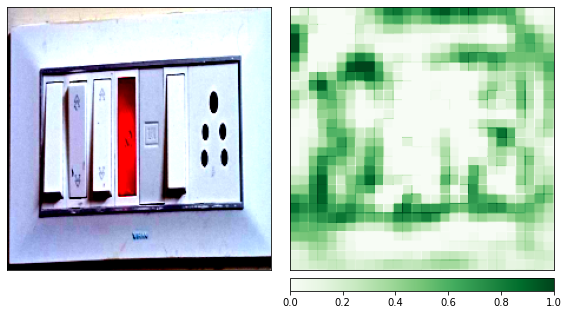

Predicted: matchstick ( 0.20359809696674347 )


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


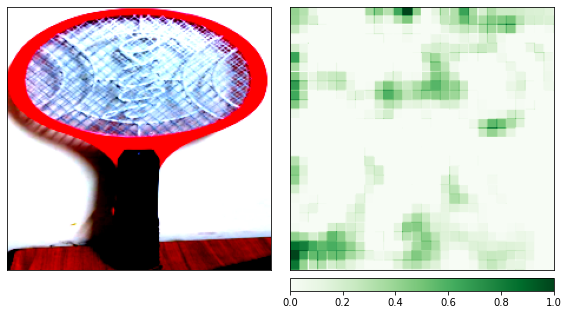

Predicted: matchstick ( 0.6691721677780151 )


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


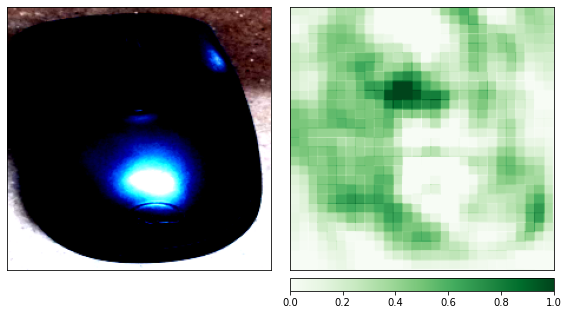

Predicted: honeycomb ( 0.5354052782058716 )


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


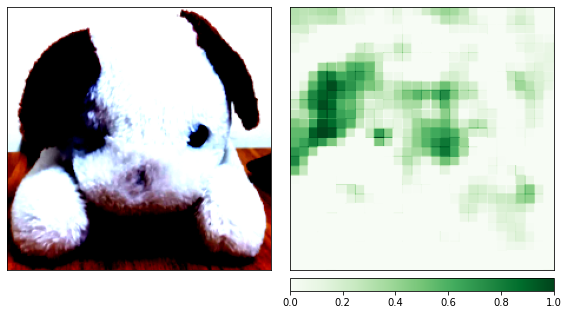

Predicted: matchstick ( 0.4470132291316986 )


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


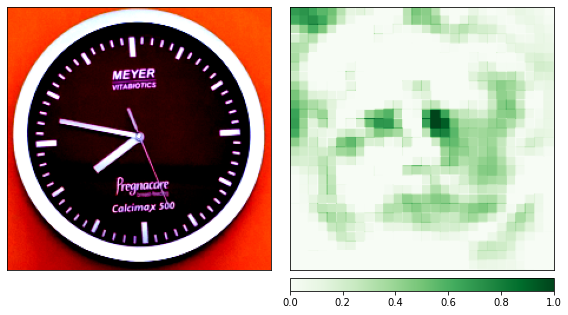

Predicted: honeycomb ( 0.902177631855011 )


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


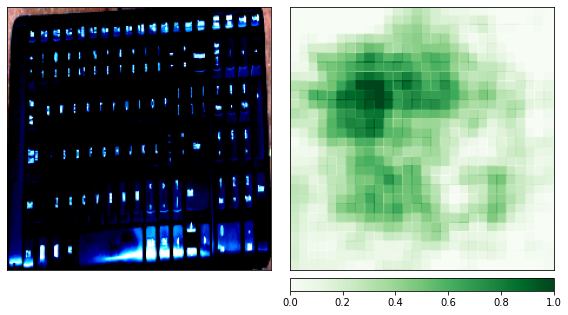

In [23]:
for image in images:
    transformed_img = transform(image)

    img_tensor = transform_normalize(transformed_img)
    img_tensor = img_tensor.unsqueeze(0)

    img_tensor = img_tensor.to(device)
    output = model(img_tensor)
    output = F.softmax(output, dim=1)
    prediction_score, pred_label_idx = torch.topk(output, 1)

    pred_label_idx.squeeze_()
    predicted_label = categories[pred_label_idx.item()]
    print('Predicted:', predicted_label, '(', prediction_score.squeeze().item(), ')')

    integrated_gradients = IntegratedGradients(model)    
    occlusion = Occlusion(model)

    attributions_occ = occlusion.attribute(img_tensor,
                                           strides = (3, 8, 8),
                                           target=pred_label_idx,
                                           sliding_window_shapes=(3,15, 15),
                                           baselines=0)
    _ = viz.visualize_image_attr_multiple(np.transpose(attributions_occ.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      ["original_image", "heat_map"],
                                      ["all", "positive"],
                                      show_colorbar=True,
                                      outlier_perc=2,
                                     )

# Gradient SHAP

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: honeycomb ( 0.2919740676879883 )


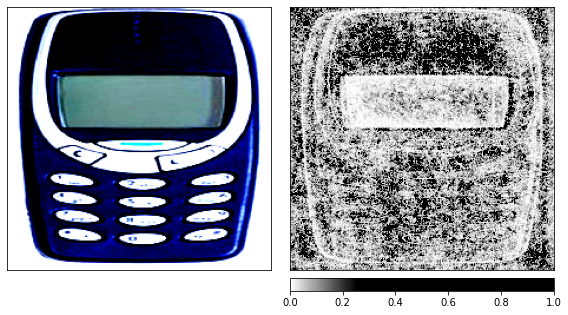

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: digital clock ( 0.5616500377655029 )


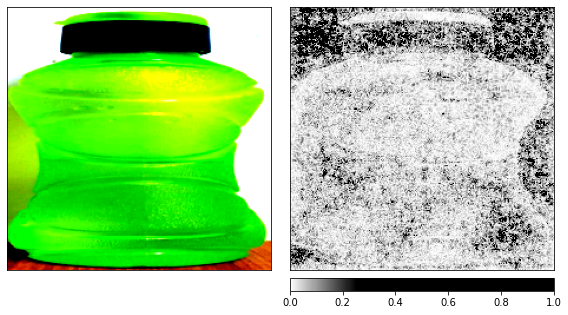

Predicted: mortar ( 0.4330064654350281 )


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


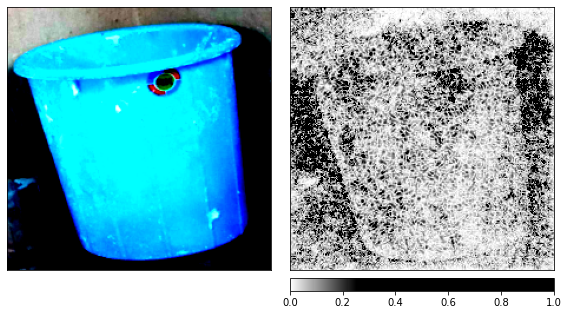

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: coffee mug ( 0.5445936322212219 )


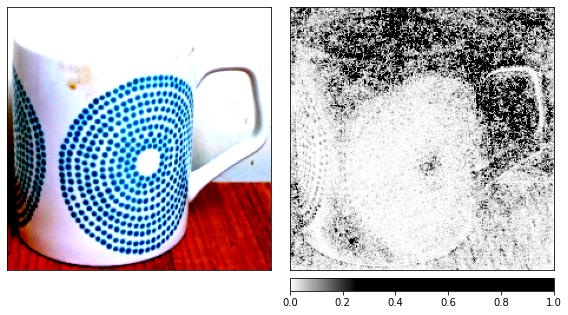

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: digital clock ( 0.26455655694007874 )


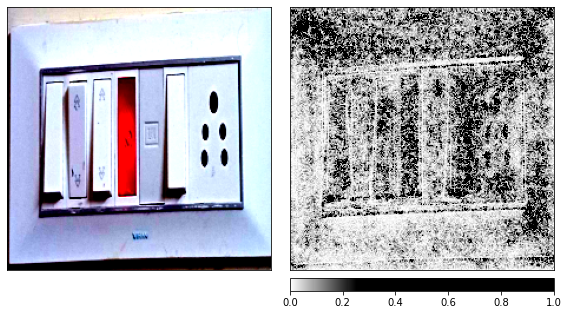

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: matchstick ( 0.20359809696674347 )


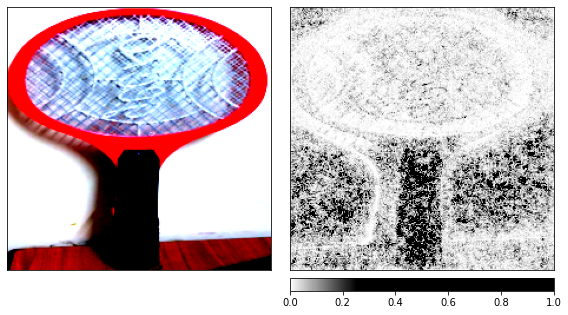

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: matchstick ( 0.6691721677780151 )


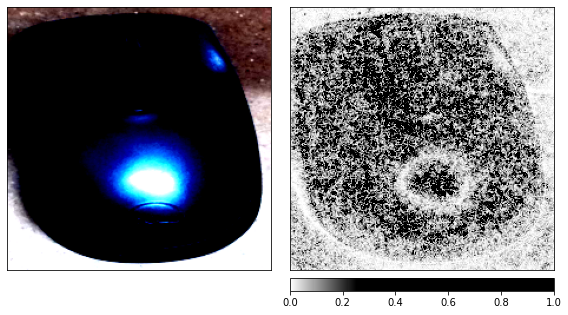

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: honeycomb ( 0.5354052782058716 )


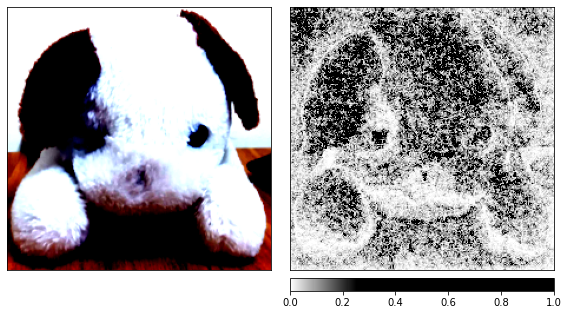

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: matchstick ( 0.4470132291316986 )


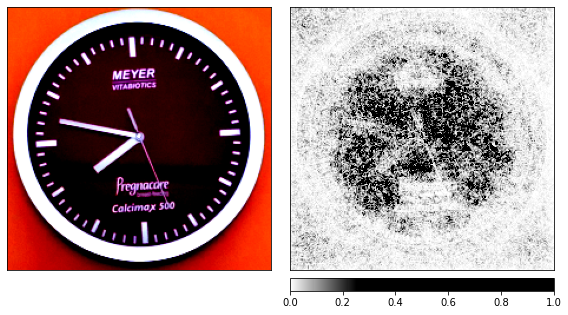

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted: honeycomb ( 0.902177631855011 )


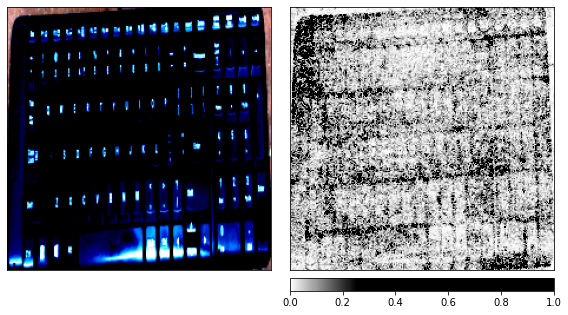

In [24]:
for image in images:
    transformed_img = transform(image)

    img_tensor = transform_normalize(transformed_img)
    img_tensor = img_tensor.unsqueeze(0)

    img_tensor = img_tensor.to(device)
    output = model(img_tensor)
    output = F.softmax(output, dim=1)
    prediction_score, pred_label_idx = torch.topk(output, 1)

    pred_label_idx.squeeze_()
    predicted_label = categories[pred_label_idx.item()]
    print('Predicted:', predicted_label, '(', prediction_score.squeeze().item(), ')')

    integrated_gradients = IntegratedGradients(model)
    torch.manual_seed(0)
    np.random.seed(0)

    gradient_shap = GradientShap(model)

    # Defining baseline distribution of images
    rand_img_dist = torch.cat([img_tensor * 0, img_tensor * 1])

    attributions_gs = gradient_shap.attribute(img_tensor,
                                              n_samples=50,
                                              stdevs=0.0001,
                                              baselines=rand_img_dist,
                                              target=pred_label_idx)
    _ = viz.visualize_image_attr_multiple(np.transpose(attributions_gs.squeeze().cpu().detach().numpy(), (1,2,0)),
                                          np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                                          ["original_image", "heat_map"],
                                          ["all", "absolute_value"],
                                          cmap=default_cmap,
                                          show_colorbar=True)

In [25]:
import shap

In [26]:
def predict(imgs: torch.Tensor) -> torch.Tensor:
    imgs = torch.tensor(imgs)
    imgs = imgs.permute(0, 3, 1, 2)
    
    img_tensor = imgs.to(device)

    output = model(img_tensor)
    return output

Classes: [487]: ['cellular telephone']


  0%|          | 0/9998 [00:00<?, ?it/s]

Partition explainer: 2it [00:28, 28.72s/it]               


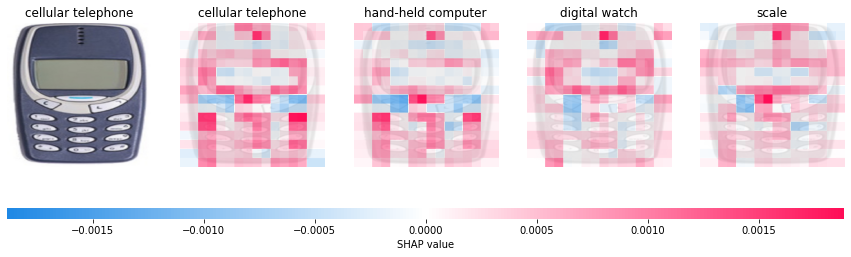

Classes: [899]: ['water jug']


  0%|          | 0/9998 [00:00<?, ?it/s]

Partition explainer: 2it [00:27, 27.27s/it]               


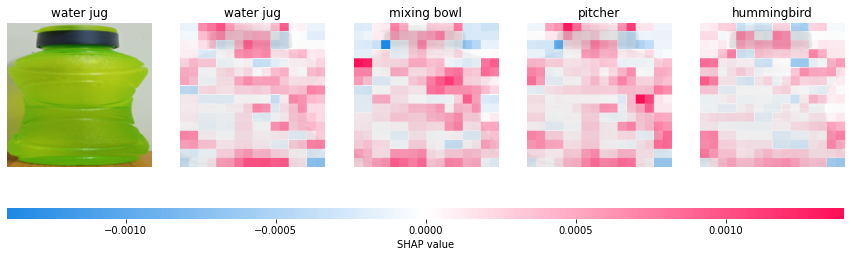

Classes: [463]: ['bucket']


  0%|          | 0/9998 [00:00<?, ?it/s]

Partition explainer: 2it [00:26, 26.87s/it]               


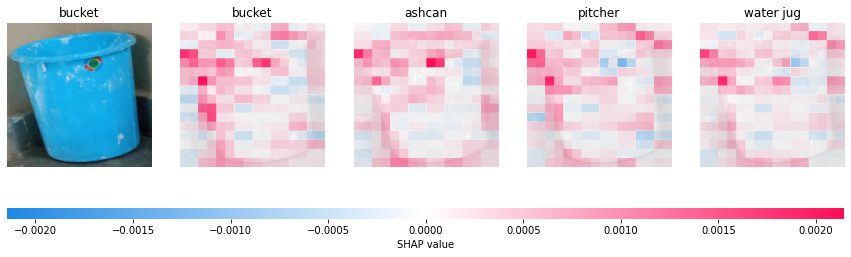

Classes: [504]: ['coffee mug']


  0%|          | 0/9998 [00:00<?, ?it/s]

Partition explainer: 2it [00:25, 25.97s/it]               


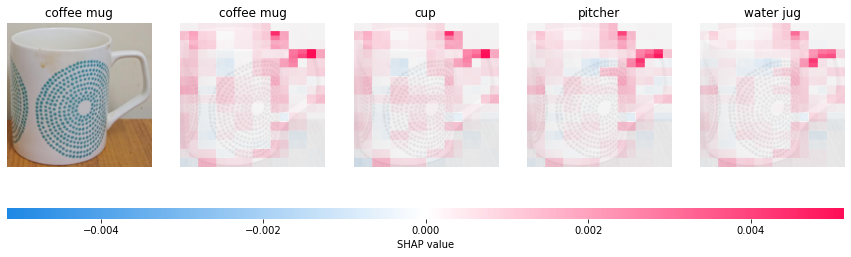

Classes: [844]: ['switch']


  0%|          | 0/9998 [00:00<?, ?it/s]

Partition explainer: 2it [00:27, 27.38s/it]               


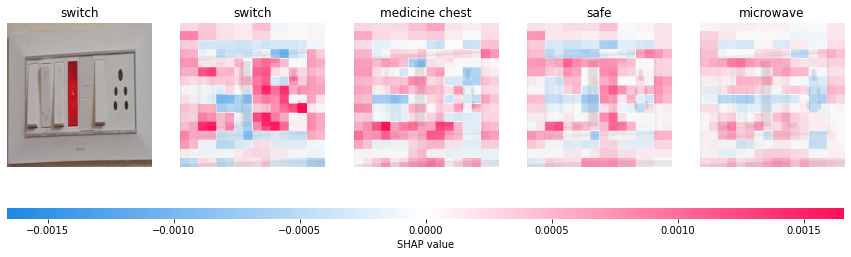

Classes: [752]: ['racket']


  0%|          | 0/9998 [00:00<?, ?it/s]

Partition explainer: 2it [00:25, 25.68s/it]               


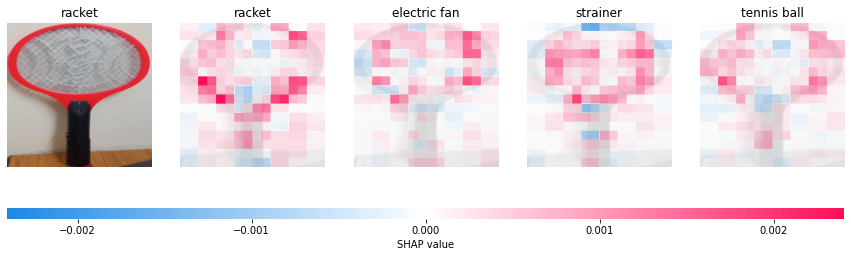

Classes: [673]: ['mouse']


  0%|          | 0/9998 [00:00<?, ?it/s]

Partition explainer: 2it [00:25, 25.33s/it]               


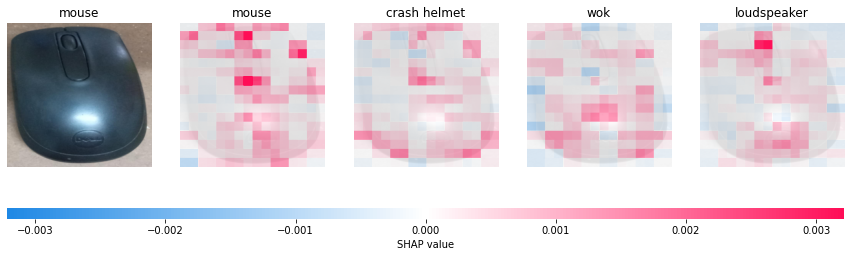

Classes: [850]: ['teddy']


  0%|          | 0/9998 [00:00<?, ?it/s]

Partition explainer: 2it [00:25, 25.27s/it]               


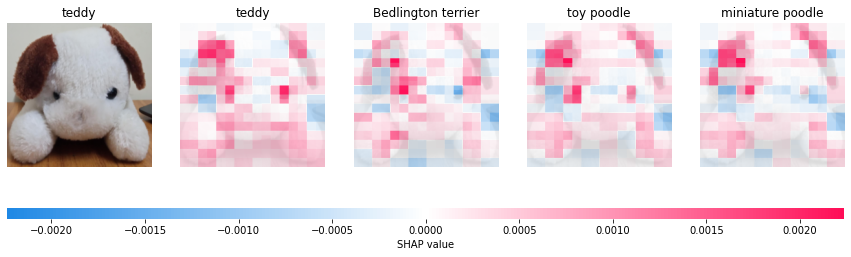

Classes: [892]: ['wall clock']


  0%|          | 0/9998 [00:00<?, ?it/s]

Partition explainer: 2it [00:25, 25.59s/it]               


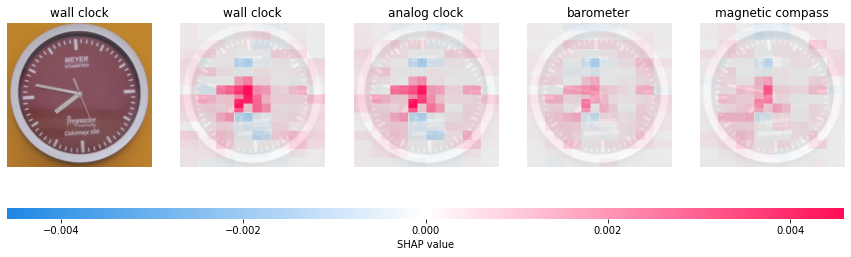

Classes: [508]: ['computer keyboard']


  0%|          | 0/9998 [00:00<?, ?it/s]

Partition explainer: 2it [00:25, 25.63s/it]               


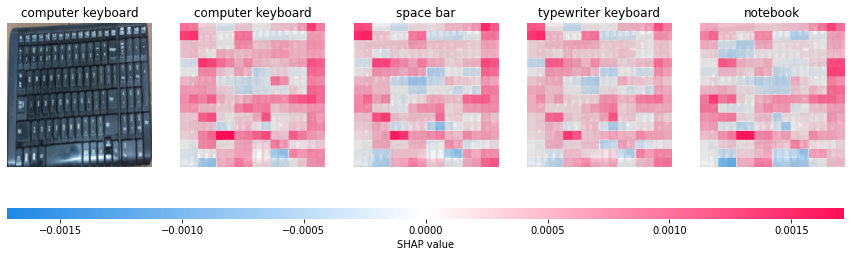

In [27]:
for i in range(len(images)):
    transform = T.Compose([
        T.Resize((224, 224)),
        T.ToTensor(),
        T.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )
    ])

    img_tensor = transform(images[i])
    img_tensor = img_tensor.unsqueeze(0)
    img_tensor = img_tensor.to(device)
    model_out = model(img_tensor)
    classes = torch.argmax(model_out, axis=1).cpu().numpy()
    print(f'Classes: {classes}: {np.array(categories)[classes]}')
    mean = [0.485, 0.456, 0.406]
    std  = [0.229, 0.224, 0.225]
    inv_transform= T.Compose([
        T.Lambda(lambda x: x.permute(0, 3, 1, 2)),
        T.Normalize(
            mean = (-1 * np.array(mean) / np.array(std)).tolist(),
            std = (1 / np.array(std)).tolist()
        ),
        T.Lambda(lambda x: x.permute(0, 2, 3, 1)),
    ])
    
    topk = 4
    batch_size = 50
    n_evals = 10000

    # define a masker that is used to mask out partitions of the input image.
    masker_blur = shap.maskers.Image("blur(128,128)", (224, 224, 3))

    # create an explainer with model and image masker
    explainer = shap.Explainer(predict, masker_blur, output_names=categories)

    # feed only one image
    # here we explain two images using 100 evaluations of the underlying model to estimate the SHAP values
    #image_np = Image.open("cat.jpeg")
    img_tensor = transform(images[i])
    img_tensor = img_tensor.unsqueeze(0)
    img_tensor = img_tensor.permute(0, 2, 3, 1)

    shap_values = explainer(img_tensor, max_evals=n_evals, batch_size=batch_size,
                            outputs=shap.Explanation.argsort.flip[:topk])
    shap_values.data = inv_transform(shap_values.data).cpu().numpy()[0]
    shap_values.values = [val for val in np.moveaxis(shap_values.values[0], -1, 0)]
    shap.image_plot(shap_values=shap_values.values,
                pixel_values=shap_values.data,
                labels=shap_values.output_names,
                true_labels=[categories[indexes[i]]])

# GradCAM

In [28]:
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
target_layers = [model.layer4[-1]]
cam = GradCAM(model=model, target_layers=target_layers, use_cuda=True)

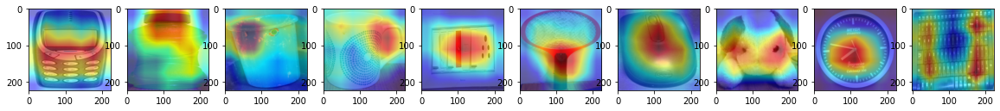

In [29]:
inv_transform= T.Compose([
    T.Normalize(
    mean = (-1 * np.array(mean) / np.array(std)).tolist(),
    std = (1 / np.array(std)).tolist()
    ),
])
fig = plt.figure(figsize=(20, 14))
for i in range(len(images)):
    transform = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
    ])
    
    #img = Image.open('cat.jpeg')

    img_tensor = transform(images[i])
    img_tensor = img_tensor.unsqueeze(0)
    img_tensor.requires_grad = True
    img_tensor = img_tensor.to(device)
    targets = [ClassifierOutputTarget(indexes[i])]

    # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
    grayscale_cam = cam(input_tensor=img_tensor, targets=targets)
    # In this example grayscale_cam has only one image in the batch:
    grayscale_cam = grayscale_cam[0, :]
    rgb_img = inv_transform(img_tensor).cpu().squeeze().permute(1, 2, 0).detach().numpy()
    visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
    fig.add_subplot(1,10, i+1)
    plt.imshow(visualization)

# GradCAM++

In [30]:
from pytorch_grad_cam import GradCAMPlusPlus
cam = GradCAMPlusPlus(model=model, target_layers=target_layers, use_cuda=True)

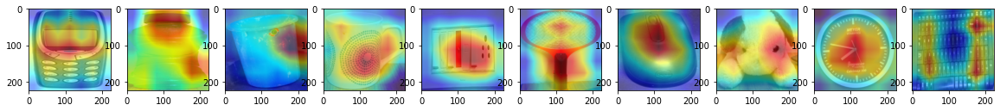

In [31]:
fig = plt.figure(figsize=(20, 14))
for i in range(len(images)):
    transform = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
    ])
    img_tensor = transform(images[i])
    img_tensor = img_tensor.unsqueeze(0)
    img_tensor.requires_grad = True
    img_tensor = img_tensor.to(device) 
    grayscale_cam = cam(input_tensor=img_tensor, targets=targets)
    #In this example grayscale_cam has only one image in the batch:
    grayscale_cam = grayscale_cam[0, :]
    rgb_img = inv_transform(img_tensor).cpu().squeeze().permute(1, 2, 0).detach().numpy()
    visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
    fig.add_subplot(1,10, i+1)
    plt.imshow(visualization)